In [1]:
!pip install ultralytics

  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.59.0
    Uninstalling tqdm-4.59.0:
      Successfully uninstalled tqdm-4.59.0


In [2]:
from ultralytics import YOLO

### Load model
We are using the nano version, which is the fastest

In [3]:
model = YOLO("yolov8n.yaml")

### Extracting and preparing stuff
For the YOLO, we need the following structure:

/dataset

    ../images
    ../labels
        ../label.txt
        
For YOLO, we need .txt files with the same name as the images and with the following structure:

class_name x_center y_center box_width box_height

Here's an example with two boxes:

0 0.7667410714285714 0.9377455357142858 0.19839285714285712 0.1245089285714285

0 0.6230133928571429 0.9749330357142857 0.17245535714285717 0.050133928571428524

__Run the following only if the dataset is not in the required formtat!__

In [17]:
import xml.etree.ElementTree as ET
import os

def extract_bbox(xml_file,output_file):
    with open(output_file, 'w') as f:
        tree = ET.parse(xml_file)
        root = tree.getroot()

        for obj in root.findall('.//object'):
            name = obj.find('name').text
            bbox = obj.find('bndbox')
            xmin = float(bbox.find('xmin').text)
            xmax = float(bbox.find('xmax').text)
            ymin = float(bbox.find('ymin').text)
            ymax = float(bbox.find('ymax').text)
            
            x_center, y_center, box_width, box_height = convert_to_yolo(xmin, xmax, ymin, ymax, 224, 224)
            line = f"{0} {x_center} {y_center} {box_width} {box_height}\n"
            f.write(line)
    os.remove(xml_file)

def convert_to_yolo(xmin, xmax, ymin, ymax, img_width, img_height):
    x_center = (xmin + xmax) / (2 * img_width)
    y_center = (ymin + ymax) / (2 * img_height)
    
    box_width = (xmax - xmin) / img_width
    box_height = (ymax - ymin) / img_height
    
    return x_center, y_center, box_width, box_height
    

In [25]:
for i in range(21):
    extract_bbox(f'dataset2yolo/labels/sp_{i}.xml',f'dataset2yolo/labels/sp_{i}.txt')

### Training the model
Check config.yaml

In [26]:
model.train(data="config.yaml", epochs=3)

Ultralytics YOLOv8.2.14  Python-3.8.8 torch-2.2.1+cpu CPU (Intel Core(TM) i7-8550U 1.80GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=config.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tru

100%|███████████████████████████████████████████████████████████████████████████████| 755k/755k [00:00<00:00, 8.33MB/s]


RuntimeError: module compiled against API version 0xf but this version of numpy is 0xe

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning C:\Users\Guilherme\Desktop\Deep-Learning-Project-main\dataset2yolo\labels... 21 images, 0 backgrounds, 

train: New cache created: C:\Users\Guilherme\Desktop\Deep-Learning-Project-main\dataset2yolo\labels.cache



val: Scanning C:\Users\Guilherme\Desktop\Deep-Learning-Project-main\dataset2yolo\labels.cache... 21 images, 0 backgroun


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      3.098      4.496      4.319         14        640: 100%|██████████| 2/2 [00:13<00:00,  6.51
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<0

                   all         21         40   0.000159      0.025    8.8e-05    8.8e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      3.527      4.547      4.354         15        640: 100%|██████████| 2/2 [00:12<00:00,  6.47
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<0

                   all         21         40   0.000159      0.025   8.84e-05   2.65e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G      3.629      4.366      4.362         17        640: 100%|██████████| 2/2 [00:16<00:00,  8.16
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<0

                   all         21         40   0.000159      0.025   9.16e-05   9.16e-06



3 epochs completed in 0.018 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train\weights\best.pt, 6.2MB

Validating runs\detect\train\weights\best.pt...
Ultralytics YOLOv8.2.14  Python-3.8.8 torch-2.2.1+cpu CPU (Intel Core(TM) i7-8550U 1.80GHz)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<0


                   all         21         40   0.000317       0.05   0.000175   1.75e-05
Speed: 5.0ms preprocess, 251.8ms inference, 0.0ms loss, 6.5ms postprocess per image
Results saved to runs\detect\train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002048913DD00>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

### Check stats
To check stats go to the folder run/detect/train

In [28]:
from PIL import Image 
from IPython.display import display

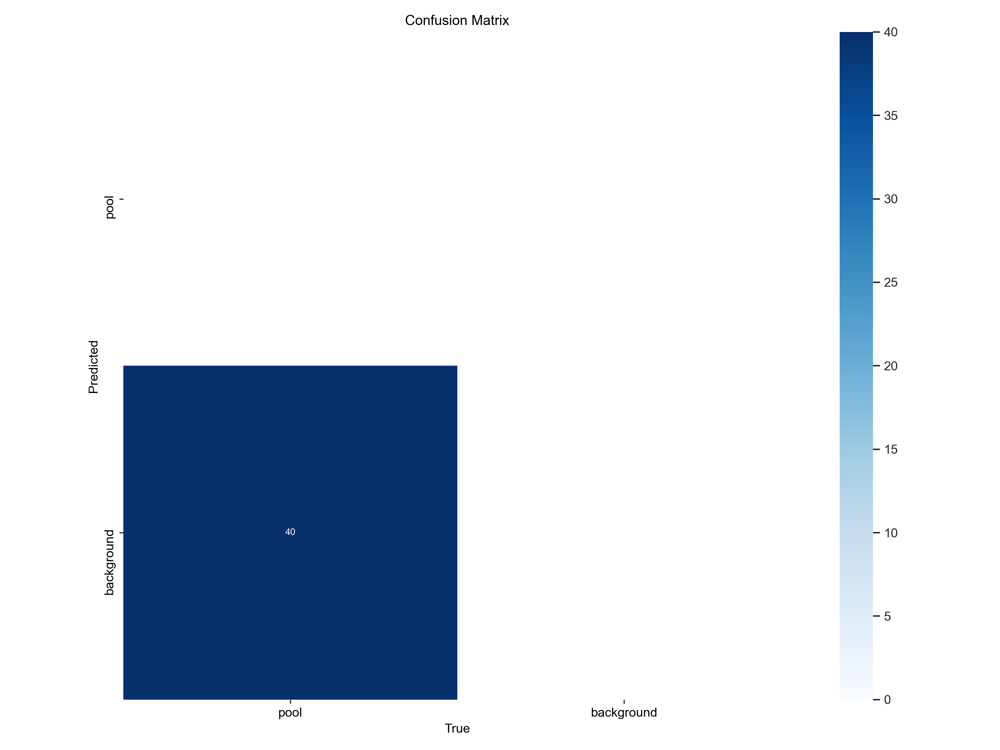

In [30]:
img = Image. open('runs/detect/train/confusion_matrix.png')
display(img)

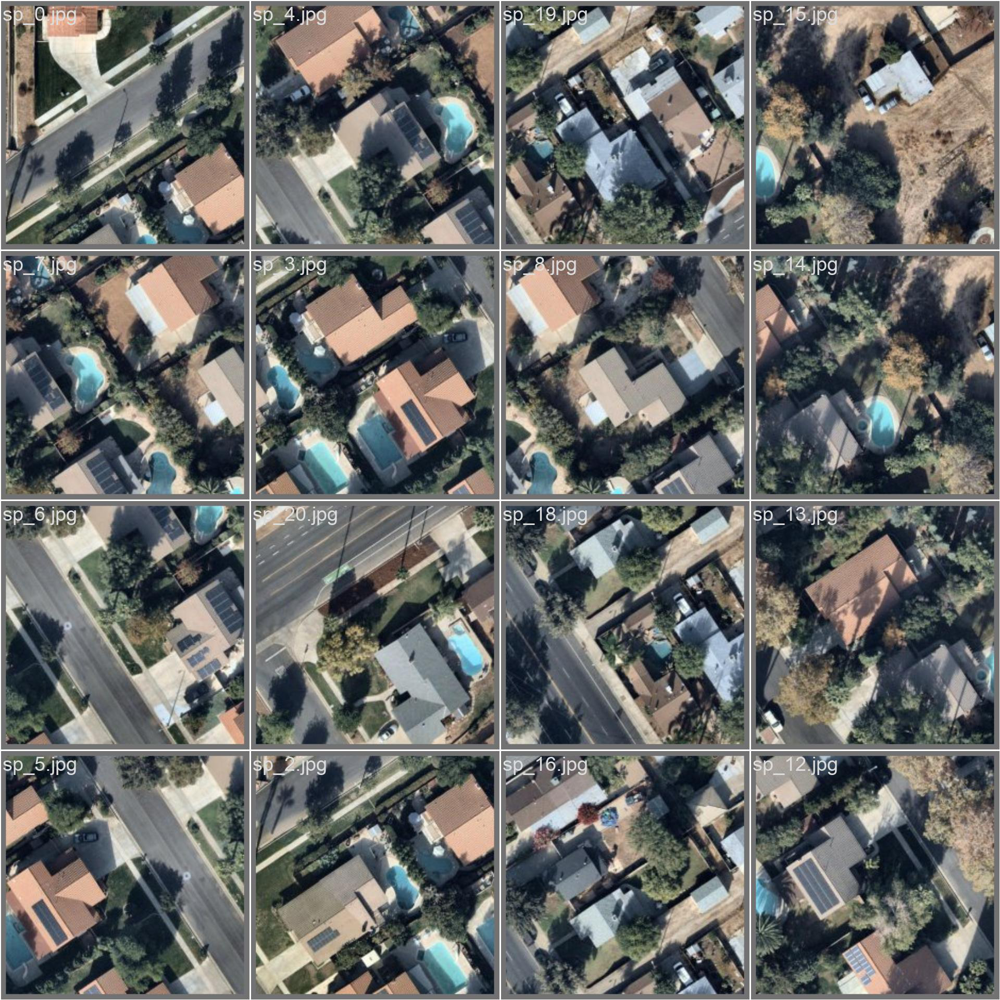

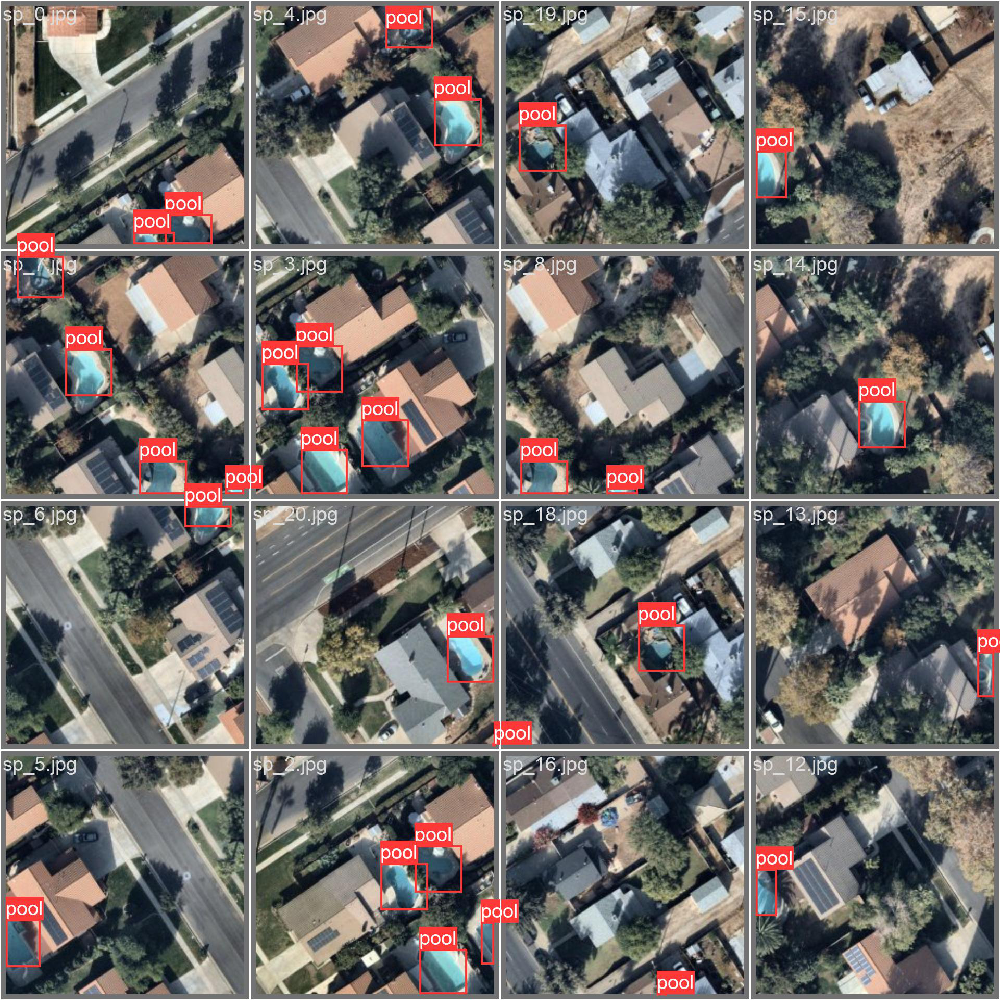

In [32]:
img2 = Image. open('runs/detect/train/val_batch0_pred.jpg')
display(img2)

img3 = Image. open('runs/detect/train/val_batch0_labels.jpg')
display(img3)